In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import transforms
import pandas as pd
from PIL import Image
from scipy.stats import pearsonr
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import torchvision.models as models
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import torchvision.models as models
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import transforms
import pandas as pd
from PIL import Image
from scipy.stats import pearsonr
import numpy as np
import matplotlib.pyplot as plt

/apps/local/shared/HC701/hc701_env/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
class CustomDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        self.data = pd.read_csv(csv_file)
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name = self.data.iloc[idx, 0]
        mask_name = self.data.iloc[idx, 1]
        image = Image.open(img_name).convert('RGB')  # Correct variable name
        mask = Image.open(mask_name).convert('L')    # Correct variable name
        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        mask = (mask > 0.5).float()

        return image, mask

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

train_csv_file = "/home/maitha.alnaqbi/Desktop/ai702_project/Coronary/train/train_data.csv"
test_csv_file = "/home/maitha.alnaqbi/Desktop/ai702_project/Coronary/test/test_data.csv"

train_dataset = CustomDataset(train_csv_file, transform=transform)
test_dataset = CustomDataset(test_csv_file, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, drop_last=True)
test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False, drop_last=True)

val_csv_file = "/home/maitha.alnaqbi/Desktop/ai702_project/Coronary/val/val_data.csv"
val_dataset = CustomDataset(val_csv_file, transform=transform)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False)

In [ ]:
#For baseline
class UNetDeeplab(nn.Module):
    def __init__(self, input_channel, output_channel):
        super(UNetDeeplab, self).__init__()

        self.model = models.segmentation.deeplabv3_resnet50(pretrained=True)

        if input_channel != 3: 
            self.model.backbone.conv1 = nn.Conv2d(input_channel, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

        self.model.classifier[4] = nn.Conv2d(256, output_channel, kernel_size=(1, 1), stride=(1, 1))

    def forward(self, x):
        return self.model(x)['out']

dev = "cuda" if torch.cuda.is_available() else "cpu"

In [26]:
#After adding the SE block
class SELayer(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SELayer, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y

class UNetDeeplab(nn.Module):
    def __init__(self, input_channel, output_channel):
        super(UNetDeeplab, self).__init__()

        self.model = models.segmentation.deeplabv3_resnet50(pretrained=True)

        if input_channel != 3:
            self.model.backbone.conv1 = nn.Conv2d(input_channel, 64, kernel_size=7, stride=2, padding=3, bias=False)

        self.model.classifier[4] = nn.Conv2d(256, output_channel, kernel_size=1, stride=1)

        for m in self.model.backbone.modules():
            if isinstance(m, models.resnet.Bottleneck):
                m.conv3 = nn.Sequential(m.conv3, SELayer(m.conv3.out_channels))

    def forward(self, x):
        features = self.model(x)['out']
        return features

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (with SE (1st experiment)))**

In [22]:
def display_images_with_masks(images, masks, predictions):
    num_samples = len(images)
    fig, axs = plt.subplots(num_samples, 2, figsize=(10, 4 * num_samples))

    for i in range(num_samples):
        axs[i, 0].imshow(images[i].permute(1, 2, 0))
        axs[i, 0].set_title("Ground Truth")
        axs[i, 0].imshow(masks[i].squeeze(), alpha=0.3, cmap='Reds')

        axs[i, 1].imshow(images[i].permute(1, 2, 0))
        axs[i, 1].set_title("Prediction")
        axs[i, 1].imshow(predictions[i].squeeze(), alpha=0.3, cmap='Blues')

    plt.tight_layout()
    plt.show()

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (with SE))**

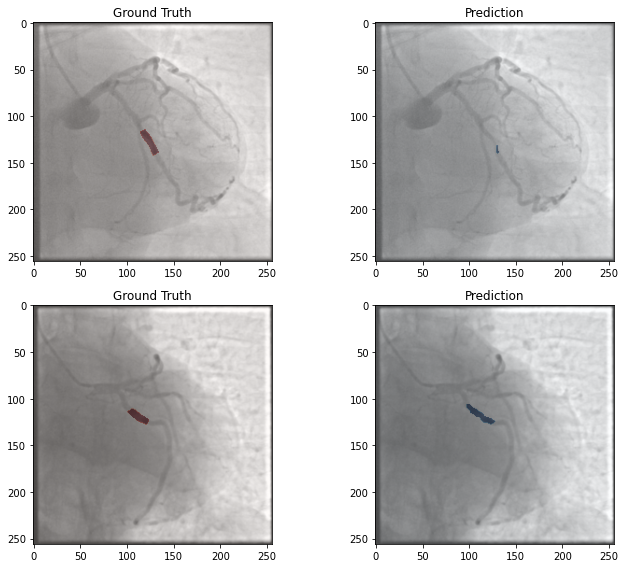

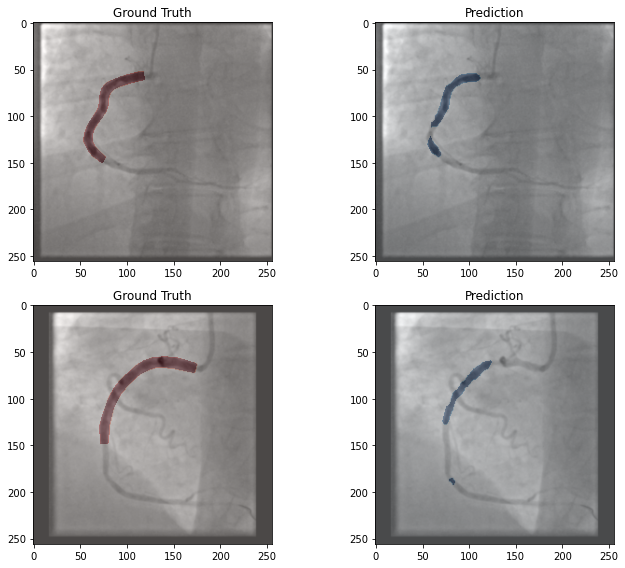

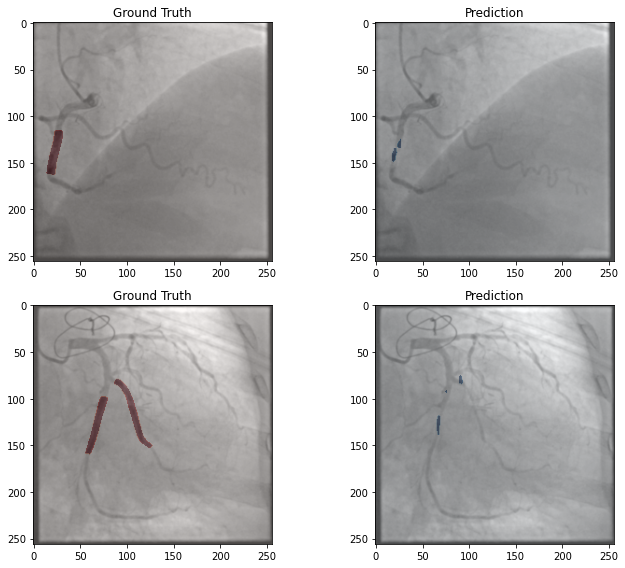

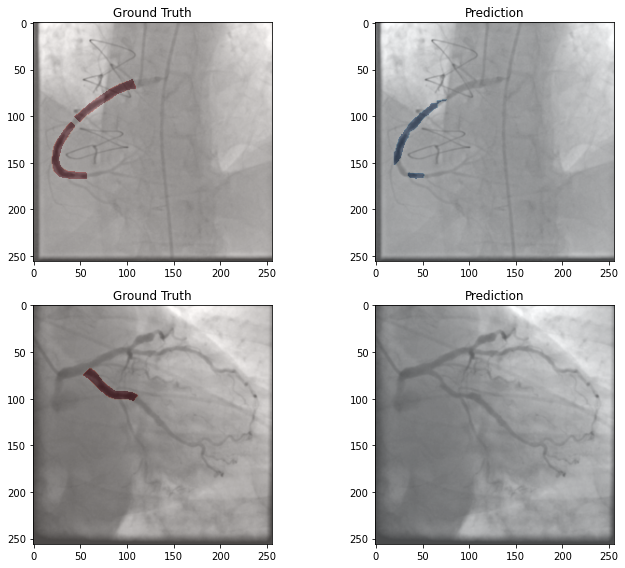

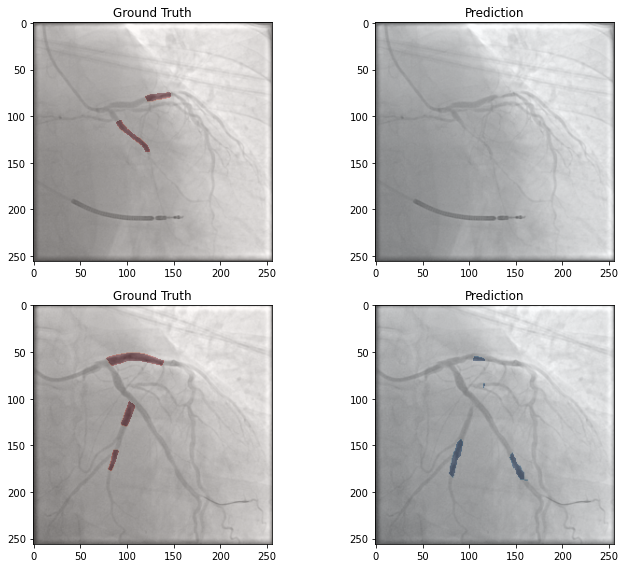

In [27]:
model = UNetDeeplab(input_channel=3, output_channel=1)
model.load_state_dict(torch.load('novel2_deeplab50_with_bce_loss.pth'))
model.eval()

predictions = []
with torch.no_grad():
    for images, masks in test_loader:
        outputs = model(images)
        sigmoid_output = torch.sigmoid(outputs)
        thresholded_output = (sigmoid_output > 0.5).float()
        predictions.append(thresholded_output.cpu().numpy())

num_samples_to_display = 10
for i, (images, masks) in enumerate(test_loader):
    sample_images = images
    sample_masks = masks
    sample_predictions = predictions[i]
    display_images_with_masks(sample_images, sample_masks, sample_predictions)
    num_samples_to_display -= images.shape[0]
    if num_samples_to_display <= 0:
        break

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (Baseline) )**

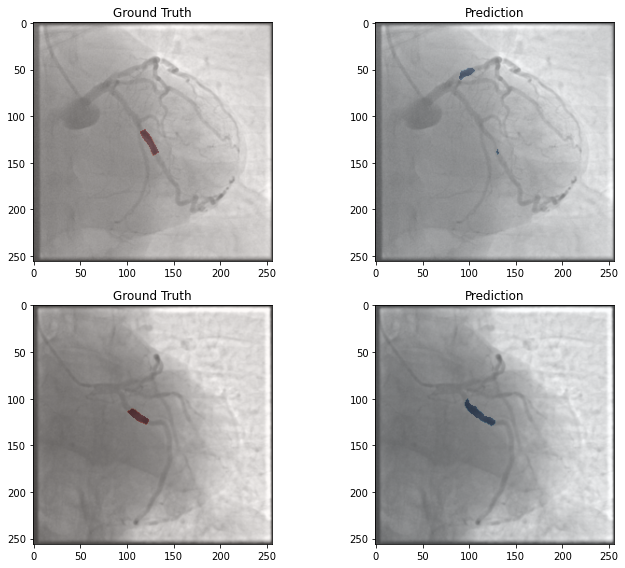

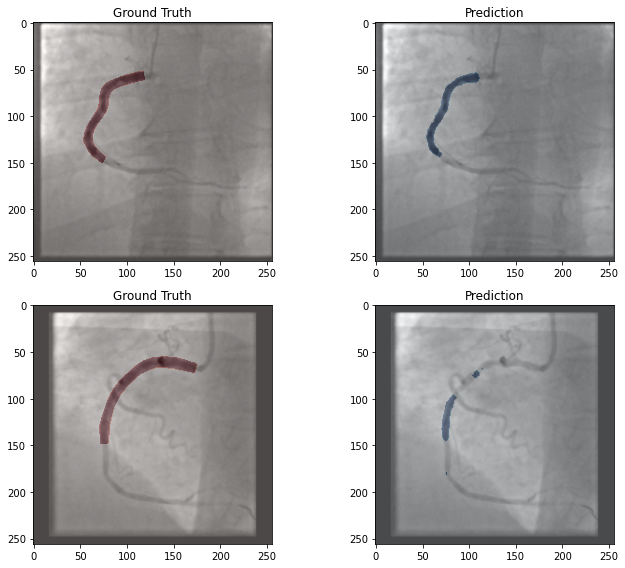

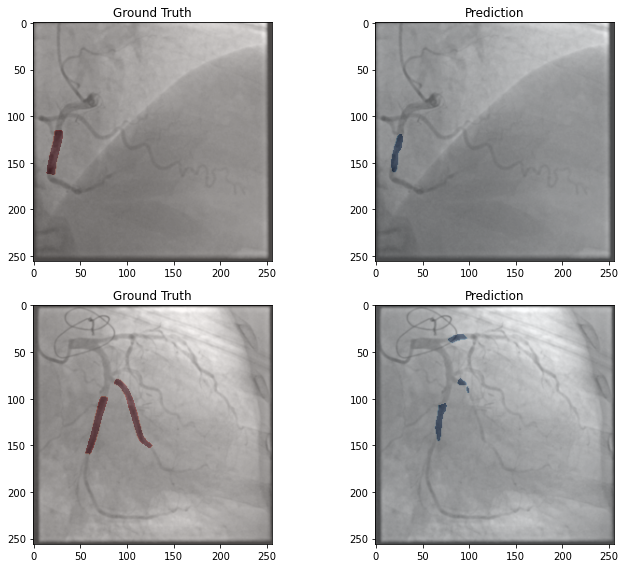

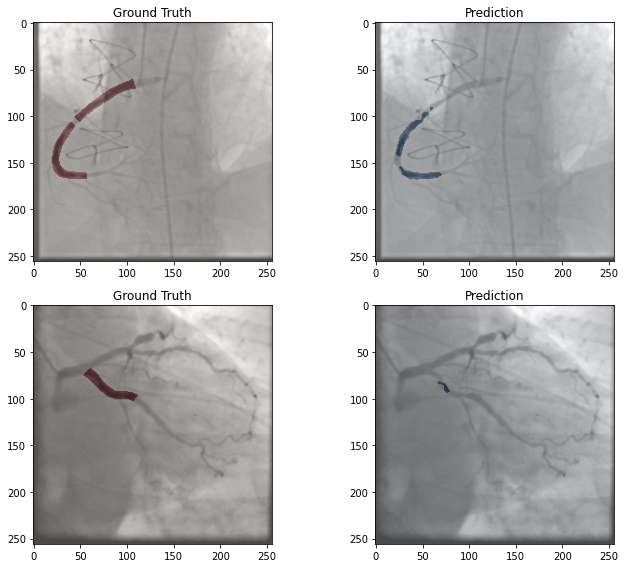

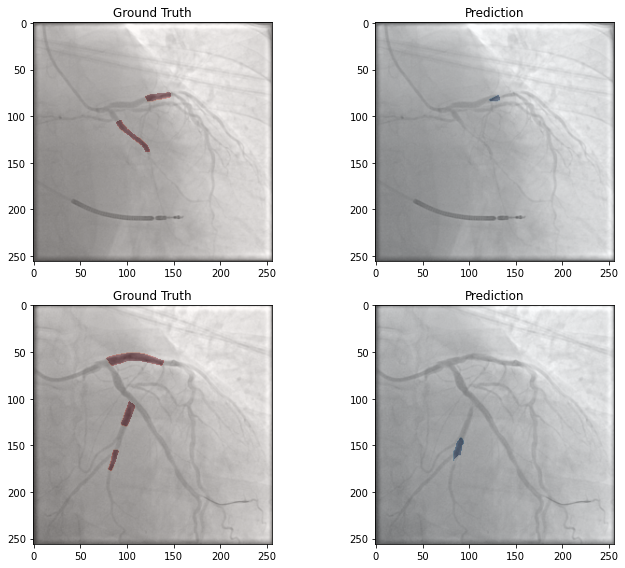

In [24]:
model = UNetDeeplab(input_channel=3, output_channel=1)
model.load_state_dict(torch.load('baseline_deeplab50_with_bce_loss.pth'))
model.eval()

predictions = []
with torch.no_grad():
    for images, masks in test_loader:
        outputs = model(images)
        sigmoid_output = torch.sigmoid(outputs)
        thresholded_output = (sigmoid_output > 0.5).float()
        predictions.append(thresholded_output.cpu().numpy())

num_samples_to_display = 10
for i, (images, masks) in enumerate(test_loader):
    sample_images = images
    sample_masks = masks
    sample_predictions = predictions[i]
    display_images_with_masks(sample_images, sample_masks, sample_predictions)
    num_samples_to_display -= images.shape[0]
    if num_samples_to_display <= 0:
        break

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (with SE and filtered images) )**

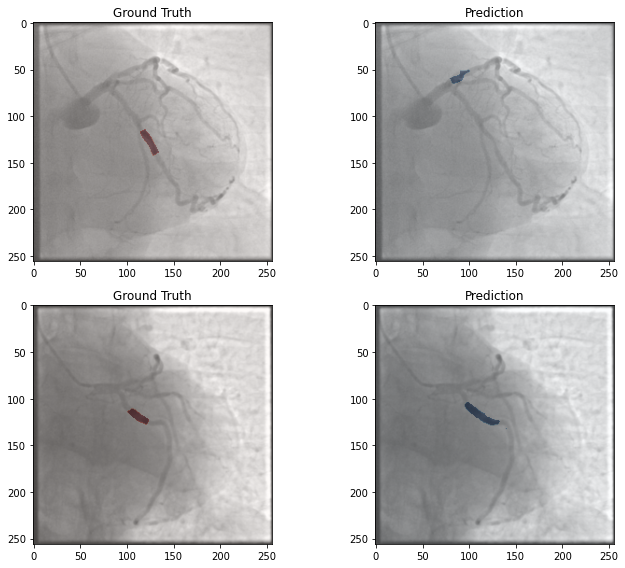

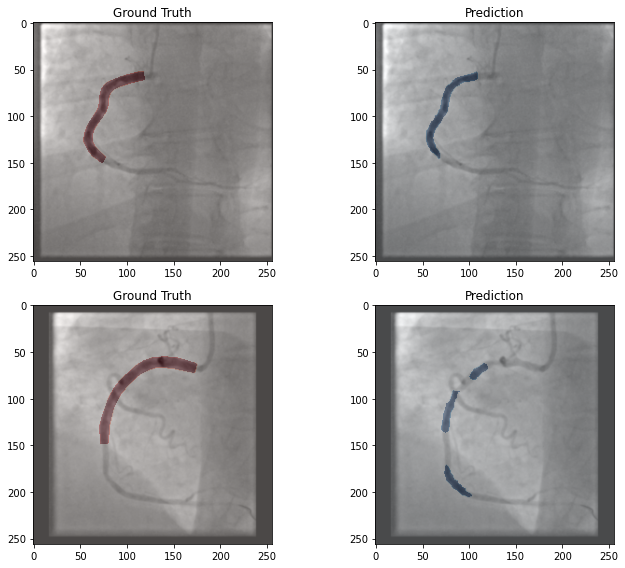

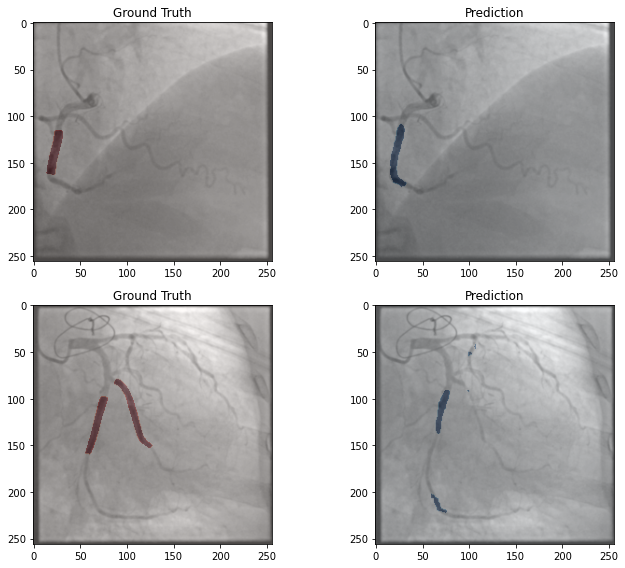

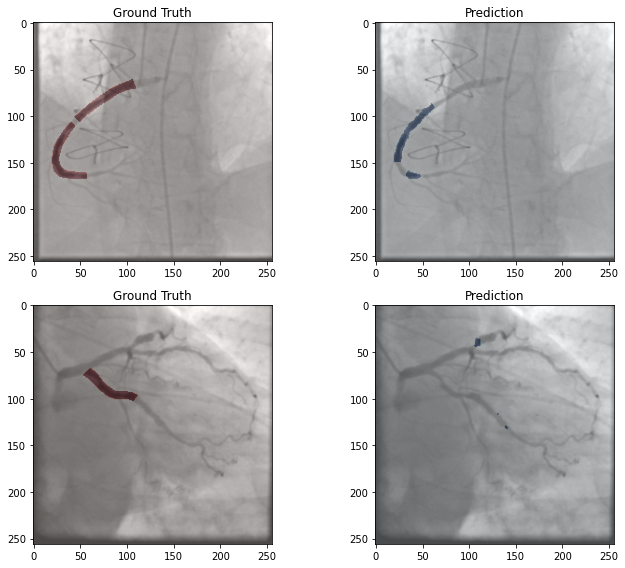

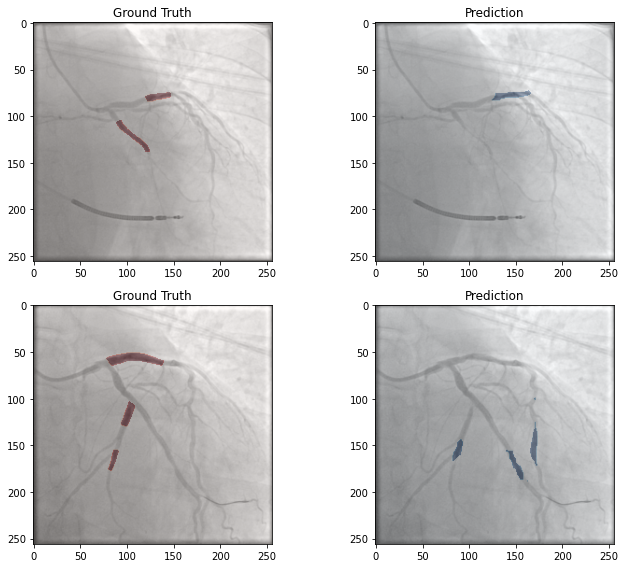

In [28]:
model = UNetDeeplab(input_channel=3, output_channel=1)
model.load_state_dict(torch.load('SE_filter_deeplab50_with_bce_loss.pth'))
model.eval()

predictions = []
with torch.no_grad():
    for images, masks in test_loader:
        outputs = model(images)
        sigmoid_output = torch.sigmoid(outputs)
        thresholded_output = (sigmoid_output > 0.5).float()
        predictions.append(thresholded_output.cpu().numpy())

num_samples_to_display = 10
for i, (images, masks) in enumerate(test_loader):
    sample_images = images
    sample_masks = masks
    sample_predictions = predictions[i]
    display_images_with_masks(sample_images, sample_masks, sample_predictions)
    num_samples_to_display -= images.shape[0]
    if num_samples_to_display <= 0:
        break

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (with SE and filtered images) + 1e-4 lr )**

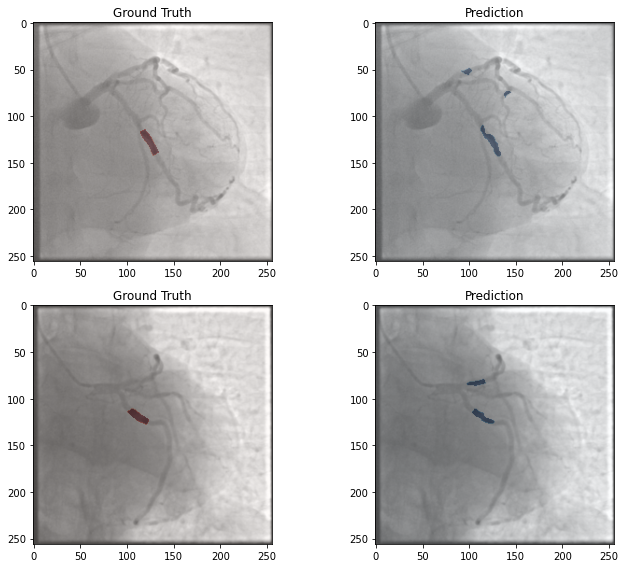

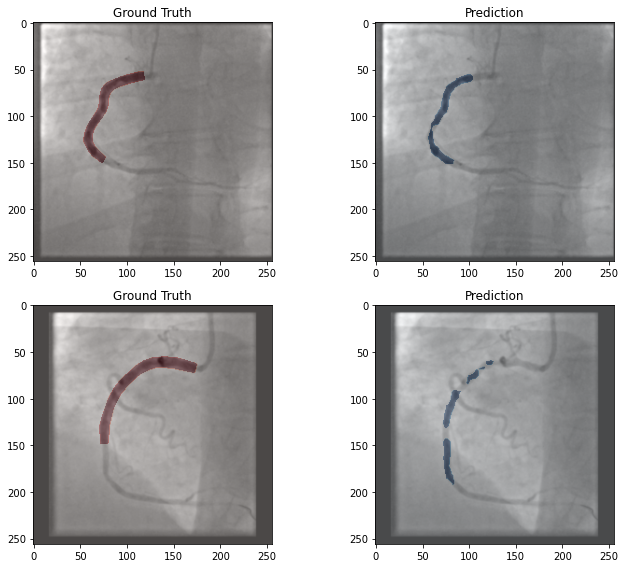

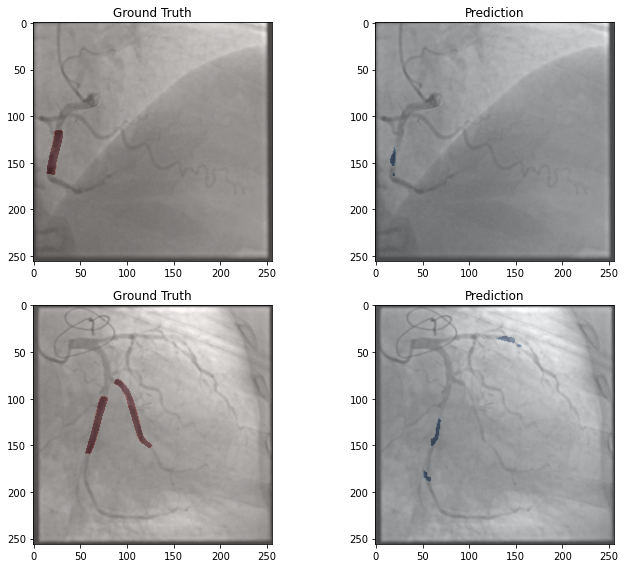

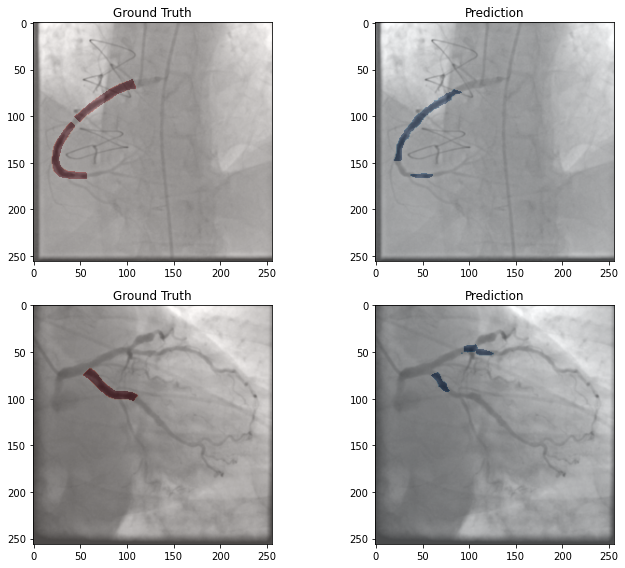

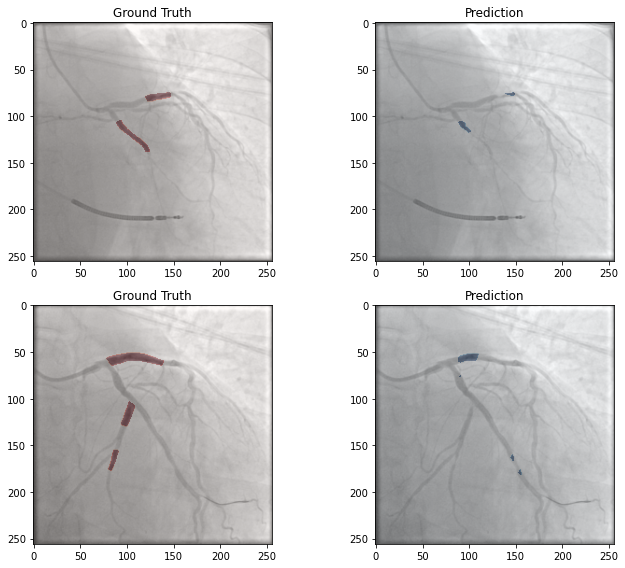

In [29]:
model = UNetDeeplab(input_channel=3, output_channel=1)
model.load_state_dict(torch.load('SE_filter_deeplab50_with_bce_loss_learningrate1.pth'))
model.eval()

predictions = []
with torch.no_grad():
    for images, masks in test_loader:
        outputs = model(images)
        sigmoid_output = torch.sigmoid(outputs)
        thresholded_output = (sigmoid_output > 0.5).float()
        predictions.append(thresholded_output.cpu().numpy())

num_samples_to_display = 10
for i, (images, masks) in enumerate(test_loader):
    sample_images = images
    sample_masks = masks
    sample_predictions = predictions[i]
    display_images_with_masks(sample_images, sample_masks, sample_predictions)
    num_samples_to_display -= images.shape[0]
    if num_samples_to_display <= 0:
        break

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (with SE and filtered images) + 1e-4 lr and 8 batch size from 2 )**

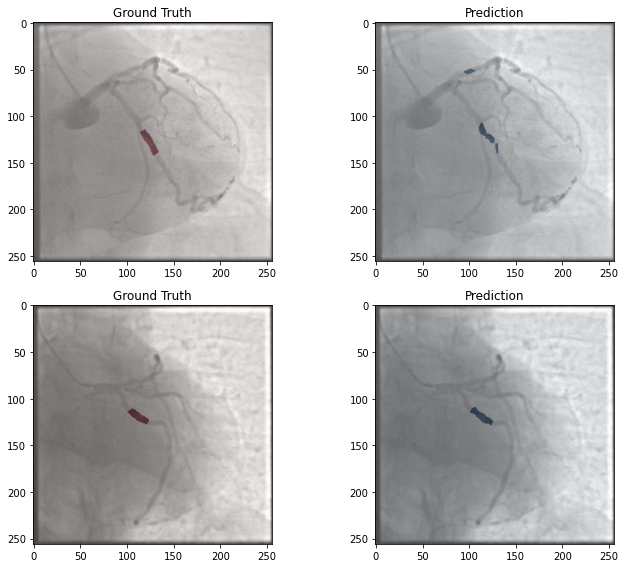

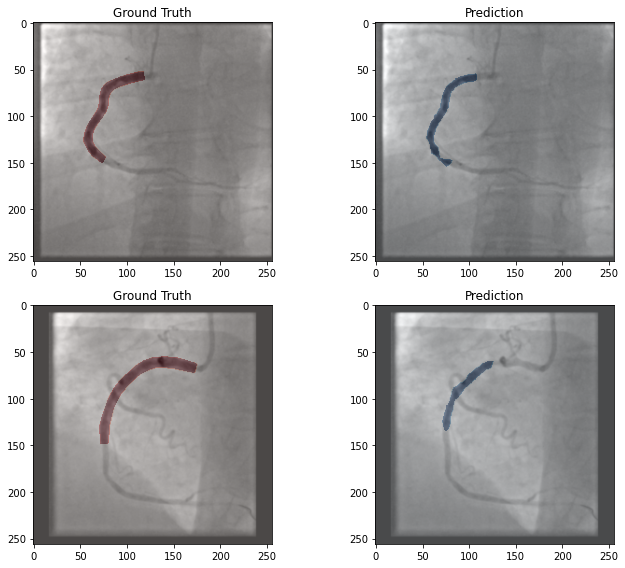

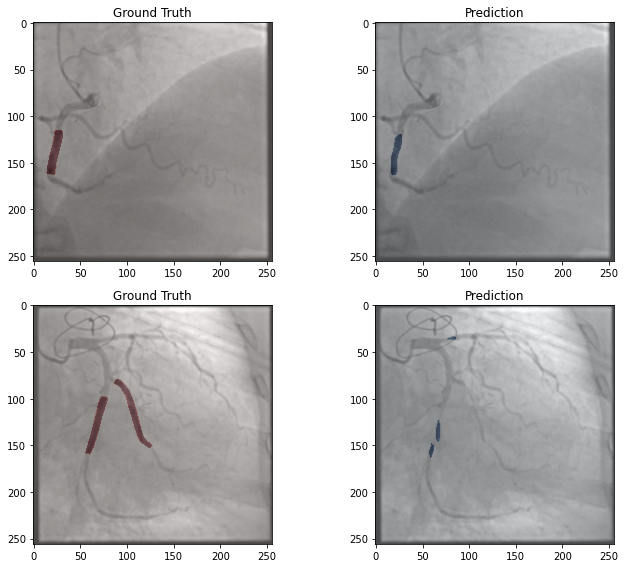

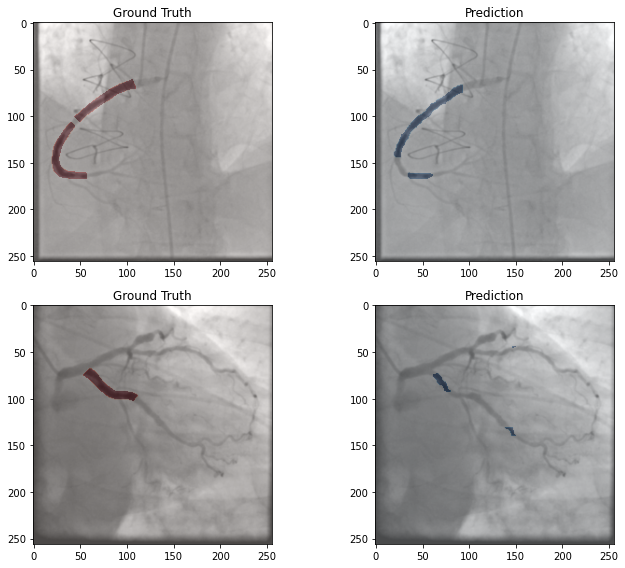

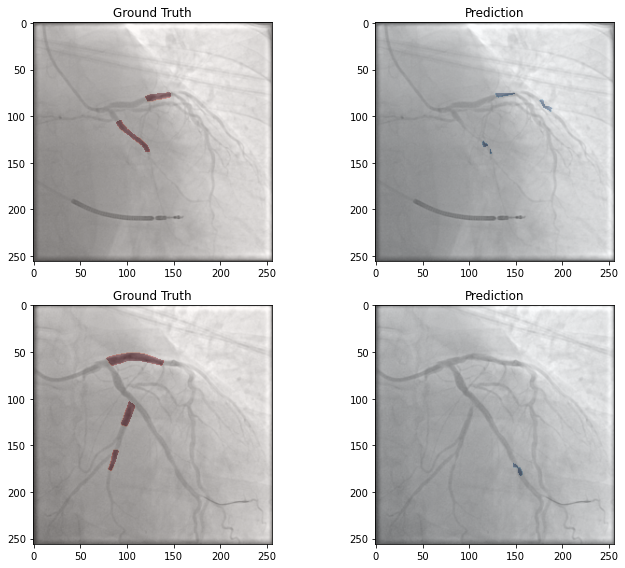

In [30]:
model = UNetDeeplab(input_channel=3, output_channel=1)
model.load_state_dict(torch.load('SE_filter_deeplab50_with_bce_loss_batch8.pth'))
model.eval()

predictions = []
with torch.no_grad():
    for images, masks in test_loader:
        outputs = model(images)
        sigmoid_output = torch.sigmoid(outputs)
        thresholded_output = (sigmoid_output > 0.5).float()
        predictions.append(thresholded_output.cpu().numpy())

num_samples_to_display = 10
for i, (images, masks) in enumerate(test_loader):
    sample_images = images
    sample_masks = masks
    sample_predictions = predictions[i]
    display_images_with_masks(sample_images, sample_masks, sample_predictions)
    num_samples_to_display -= images.shape[0]
    if num_samples_to_display <= 0:
        break

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (with SE and filtered images) + 1e-5 LR)**

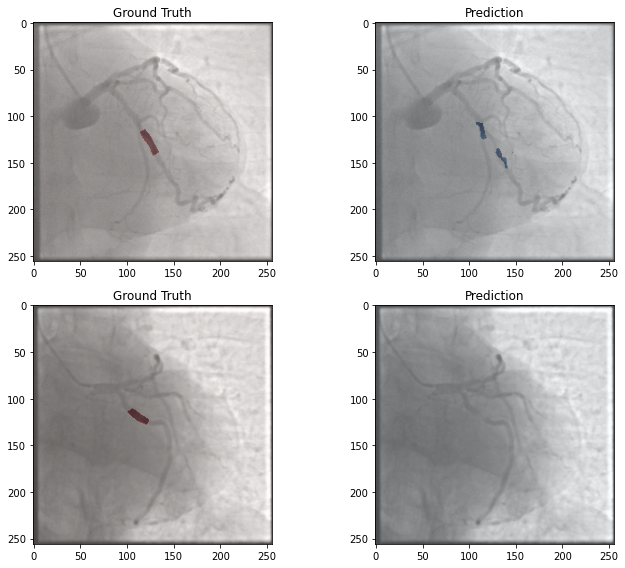

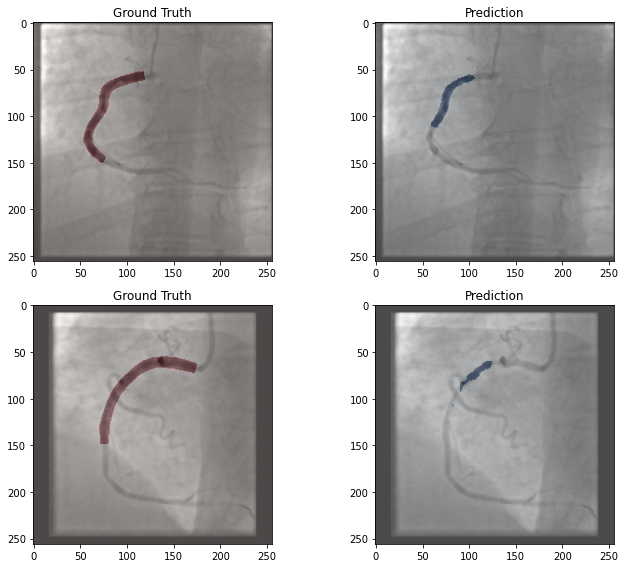

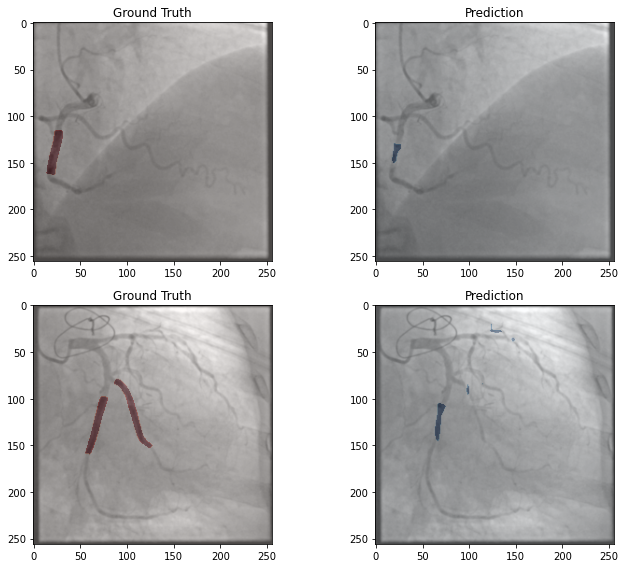

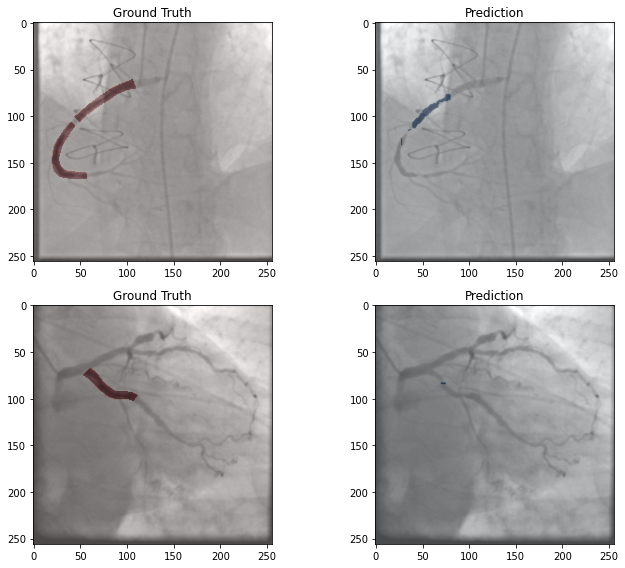

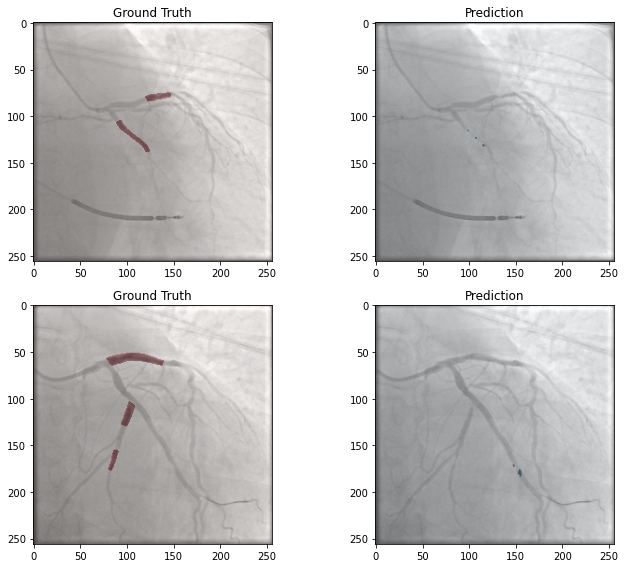

In [32]:
model = UNetDeeplab(input_channel=3, output_channel=1)
model.load_state_dict(torch.load('SE_filter_deeplab50_with_bce_loss_learningrate2.pth'))
model.eval()

predictions = []
with torch.no_grad():
    for images, masks in test_loader:
        outputs = model(images)
        sigmoid_output = torch.sigmoid(outputs)
        thresholded_output = (sigmoid_output > 0.5).float()
        predictions.append(thresholded_output.cpu().numpy())

num_samples_to_display = 10
for i, (images, masks) in enumerate(test_loader):
    sample_images = images
    sample_masks = masks
    sample_predictions = predictions[i]
    display_images_with_masks(sample_images, sample_masks, sample_predictions)
    num_samples_to_display -= images.shape[0]
    if num_samples_to_display <= 0:
        break

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (with SE and filtered images) + 1e-2 LR)**

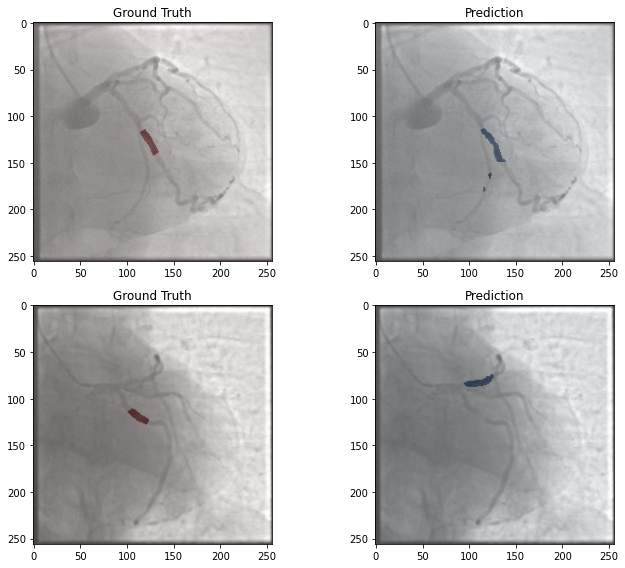

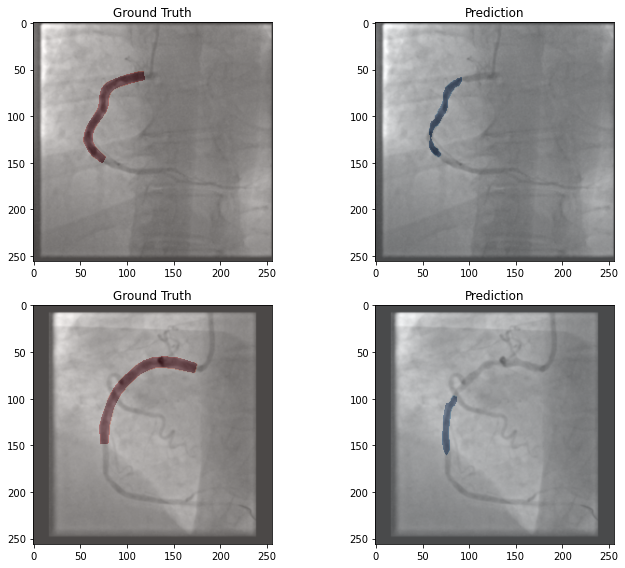

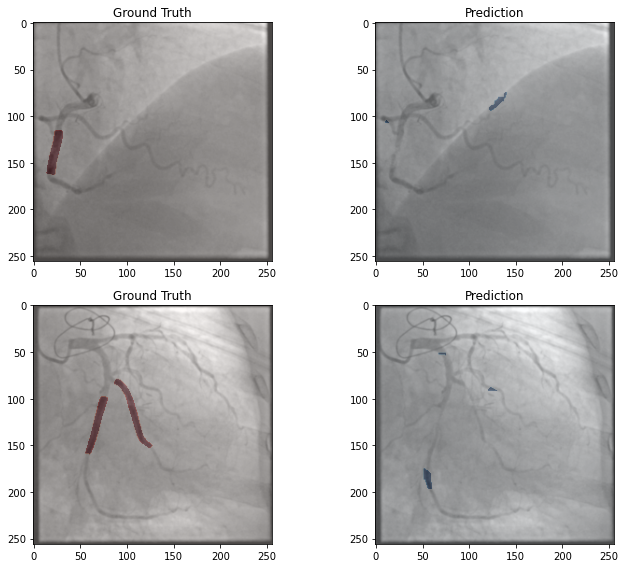

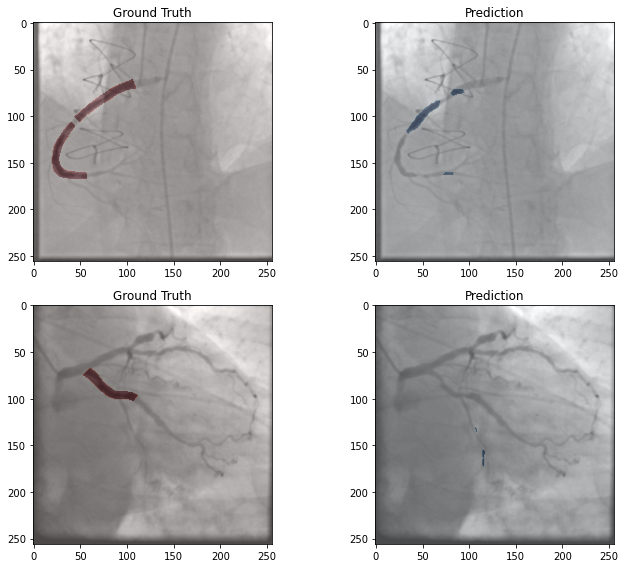

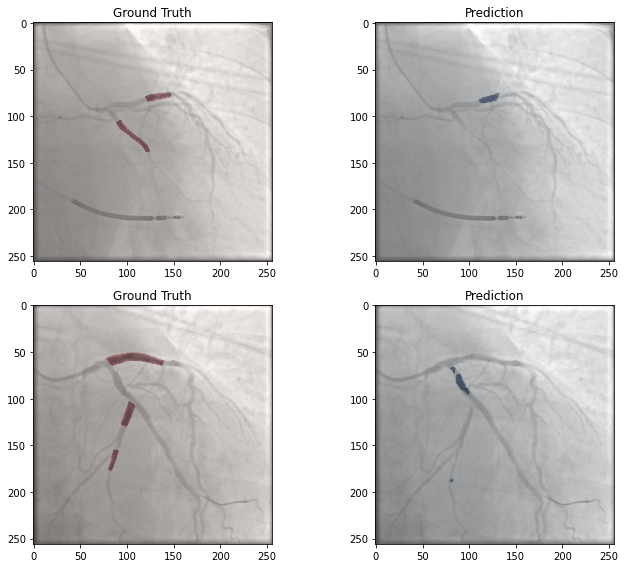

In [33]:
model = UNetDeeplab(input_channel=3, output_channel=1)
model.load_state_dict(torch.load('SE_filter_deeplab50_with_bce_loss_learningrate3.pth'))
model.eval()

predictions = []
with torch.no_grad():
    for images, masks in test_loader:
        outputs = model(images)
        sigmoid_output = torch.sigmoid(outputs)
        thresholded_output = (sigmoid_output > 0.5).float()
        predictions.append(thresholded_output.cpu().numpy())

num_samples_to_display = 10
for i, (images, masks) in enumerate(test_loader):
    sample_images = images
    sample_masks = masks
    sample_predictions = predictions[i]
    display_images_with_masks(sample_images, sample_masks, sample_predictions)
    num_samples_to_display -= images.shape[0]
    if num_samples_to_display <= 0:
        break

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (with SE and filtered images) + scheduler) with the original setup of LR of 1e-4 and Adam**

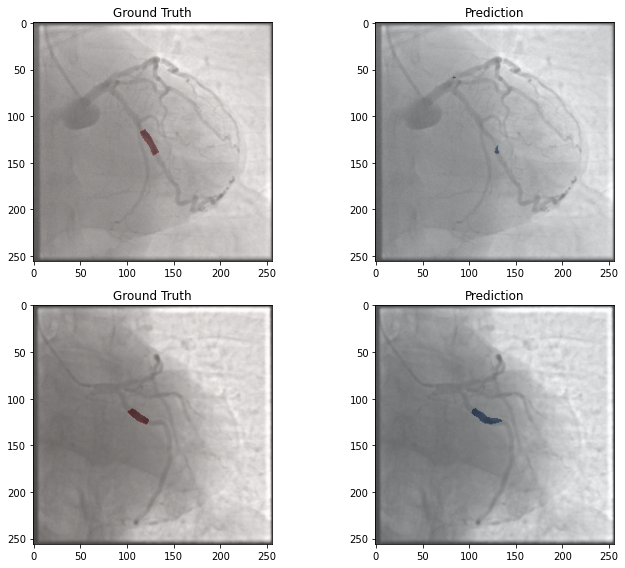

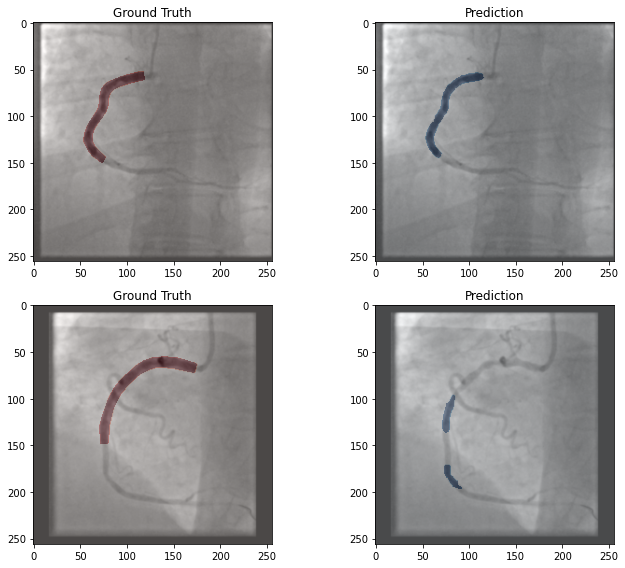

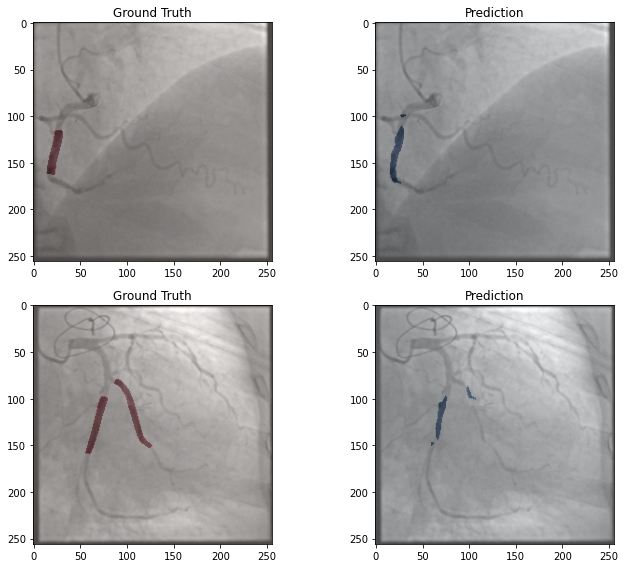

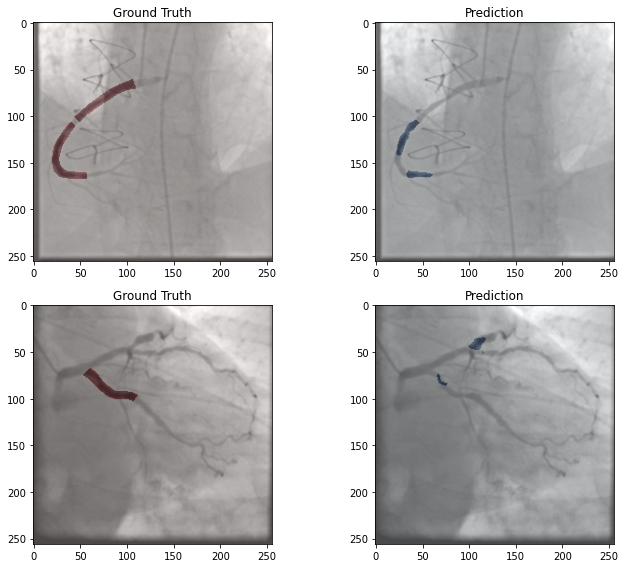

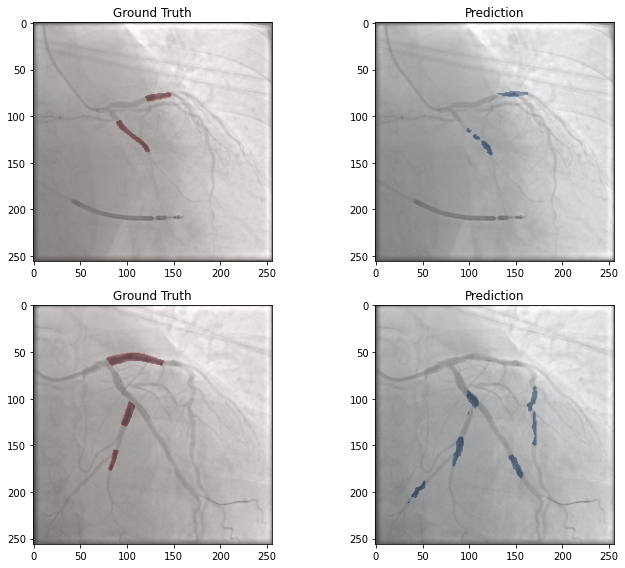

In [34]:
model = UNetDeeplab(input_channel=3, output_channel=1)
model.load_state_dict(torch.load('SE_filter_deeplab50_with_bce_loss_sched.pth'))
model.eval()

predictions = []
with torch.no_grad():
    for images, masks in test_loader:
        outputs = model(images)
        sigmoid_output = torch.sigmoid(outputs)
        thresholded_output = (sigmoid_output > 0.5).float()
        predictions.append(thresholded_output.cpu().numpy())

num_samples_to_display = 10
for i, (images, masks) in enumerate(test_loader):
    sample_images = images
    sample_masks = masks
    sample_predictions = predictions[i]
    display_images_with_masks(sample_images, sample_masks, sample_predictions)
    num_samples_to_display -= images.shape[0]
    if num_samples_to_display <= 0:
        break

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (with SE and filtered images) + with the original setup of LR of 1e-4 and Adagrad)**

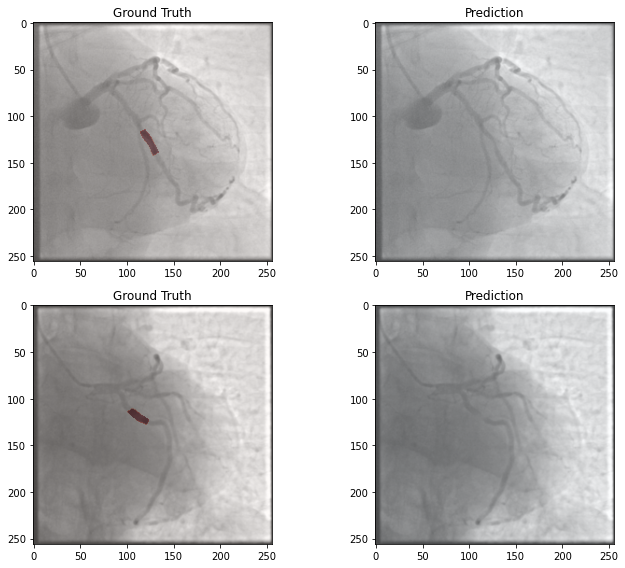

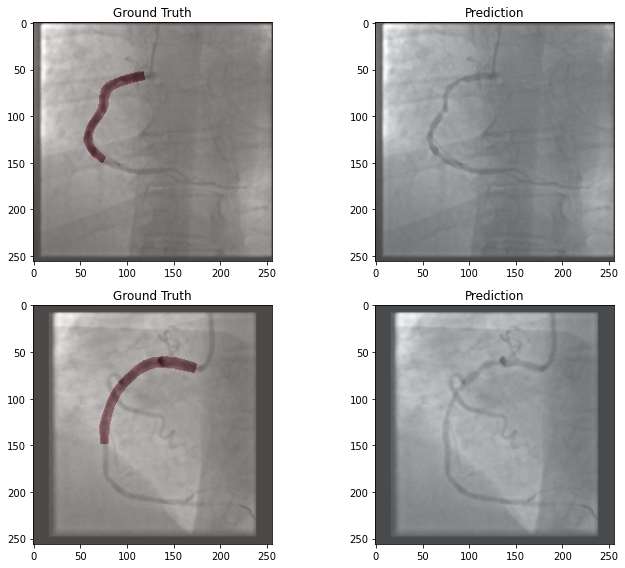

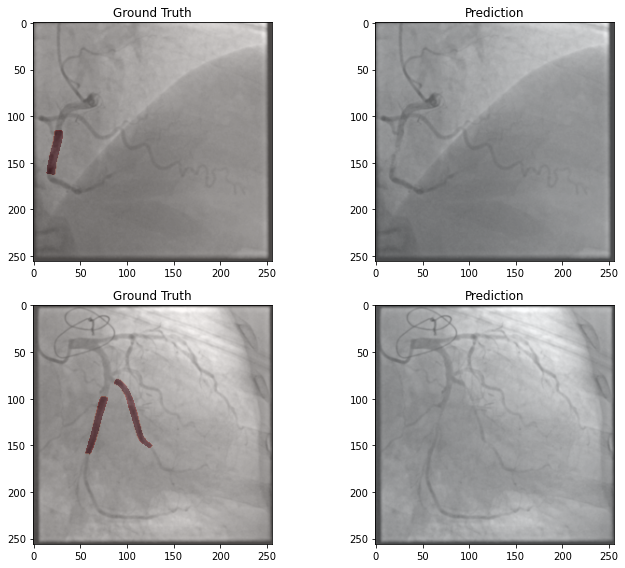

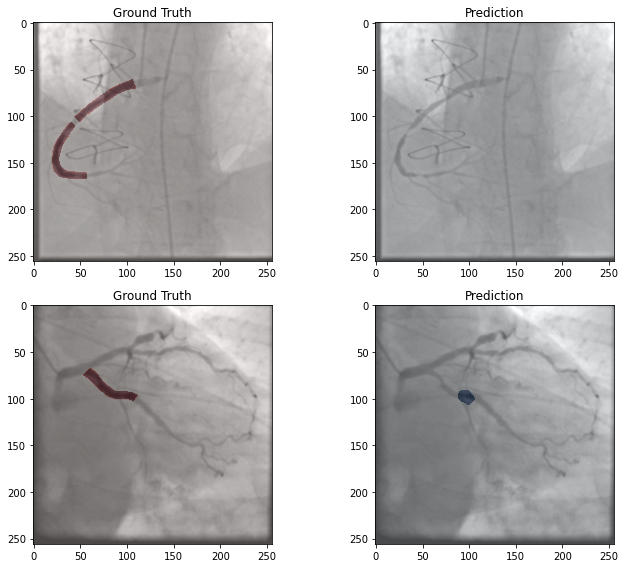

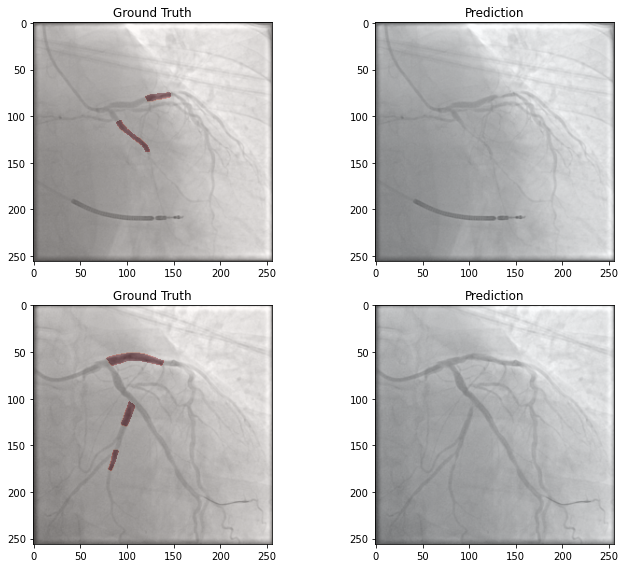

In [35]:
model = UNetDeeplab(input_channel=3, output_channel=1)
model.load_state_dict(torch.load('SE_filter_deeplab50_with_bce_loss_adagrad.pth'))
model.eval()

predictions = []
with torch.no_grad():
    for images, masks in test_loader:
        outputs = model(images)
        sigmoid_output = torch.sigmoid(outputs)
        thresholded_output = (sigmoid_output > 0.5).float()
        predictions.append(thresholded_output.cpu().numpy())

num_samples_to_display = 10
for i, (images, masks) in enumerate(test_loader):
    sample_images = images
    sample_masks = masks
    sample_predictions = predictions[i]
    display_images_with_masks(sample_images, sample_masks, sample_predictions)
    num_samples_to_display -= images.shape[0]
    if num_samples_to_display <= 0:
        break

**Display Results on Test Set (DeepLabV3 with Resnet50 backbone (with SE and filtered images) + with the original setup of LR of 1e-4 and RMSPROP)**

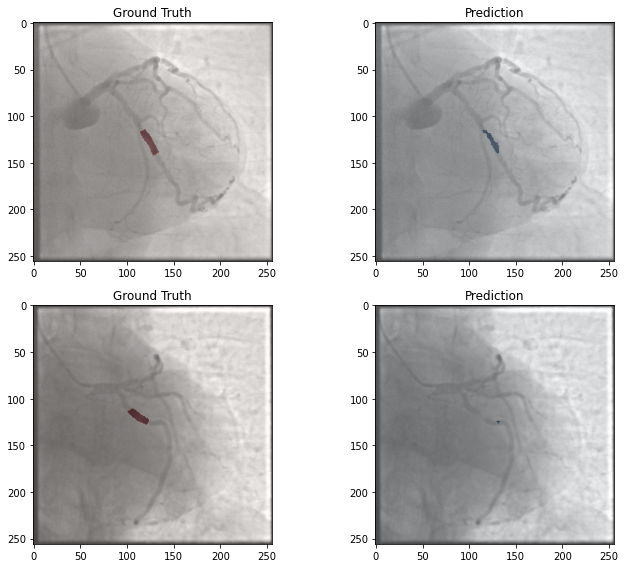

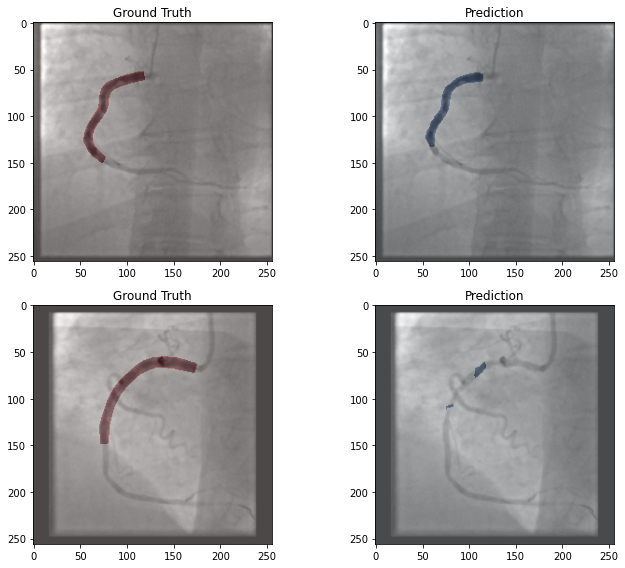

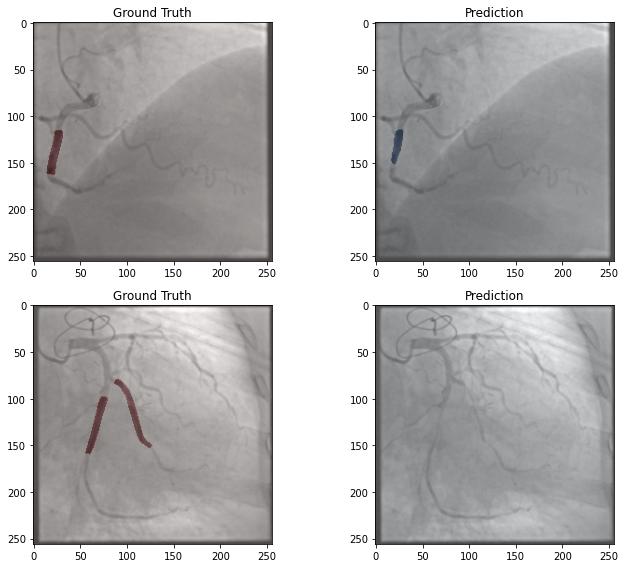

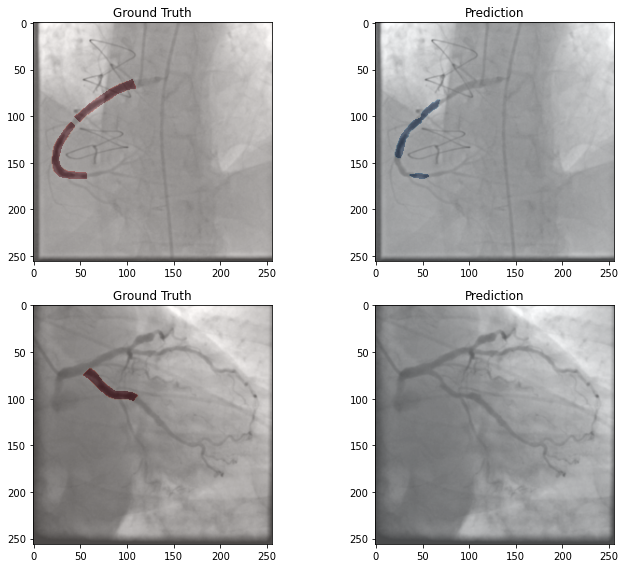

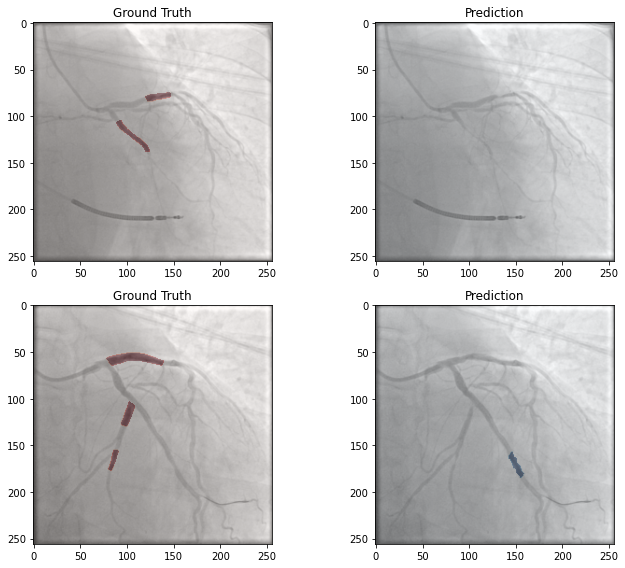

In [36]:
model = UNetDeeplab(input_channel=3, output_channel=1)
model.load_state_dict(torch.load('SE_filter_deeplab50_with_bce_loss_rmsprop.pth'))
model.eval()

predictions = []
with torch.no_grad():
    for images, masks in test_loader:
        outputs = model(images)
        sigmoid_output = torch.sigmoid(outputs)
        thresholded_output = (sigmoid_output > 0.5).float()
        predictions.append(thresholded_output.cpu().numpy())

num_samples_to_display = 10
for i, (images, masks) in enumerate(test_loader):
    sample_images = images
    sample_masks = masks
    sample_predictions = predictions[i]
    display_images_with_masks(sample_images, sample_masks, sample_predictions)
    num_samples_to_display -= images.shape[0]
    if num_samples_to_display <= 0:
        break